# TP Titanic

## Consignes

- Analyse des données du Titanic
- Un modèle directement interprétable
- Un modèle non interprétable directement **mais** l’utilisation d’une librairie au choix
- Utilisation d’une technique de Vigilance au biais

## Evaluation

Fond :
- Pertinence des analyses
- Qualité du code
- Maitrise des techniques de DS

Forme :
- Clarté des explications
- Qualité des illustrations (graphs, figures…)
- Cohérence de l’histoire racontée

##### Analyse des données du Titanic (A supprimer avant de rendre)

D'après cours de Nicolas Rochet, pour commencer : 

Nettoyage minimal des données
- Gestion des doublons et format de données
- Gestion des donnnées manquantes
- Gestion des données abérantes (outliers)

Etapes de préparation souvent nécessaires
- Encodage des données catégorielles
- Scaling des données
- Equilibrage des données
- Discrétisation des données

Etapes visant à améliorer l'information contenue dans le dataset
- Création de features
- Sélection de features

In [1]:
#importer les librairies 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

* Importer les données

In [2]:
data = pd.read_csv("C:/Users/sophi/Desktop/DESU Data analyse appliquée aux Neurosciences/Devoir Titanic/Data_Titanic.csv")
data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


* Explorer les données

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [4]:
data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [5]:
data.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [6]:
print (data.columns)

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')


* Visulisation et nettoyage des données

In [7]:
data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

<AxesSubplot:>

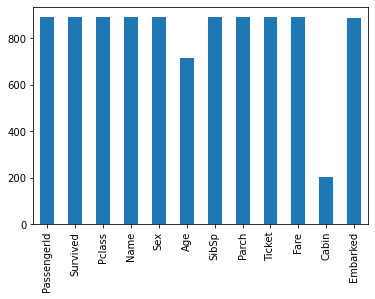

In [8]:
data.count().plot(kind='bar')
#La colonne cabin a vraiment peu de valeurs (beaucoup de NaN)
#La colonne age a également des valeurs manquantes (moins que cabin)

    - Remplacer les valeurs manquantes et convertir en valeurs numériques

1) Colonne Cabin

In [9]:
#colonne cabin : valeur manquante = pas de cabine, numéro de cabin disponible = cabine -> binaire
data['Cabin'].loc[data['Cabin'].notnull()]=1
data.head()

C:\Users\sophi\anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,1,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,1,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [10]:
data['Cabin'].fillna(0, inplace=True)
data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,0,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,1,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,0,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,1,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,0,S


In [11]:
data.tail()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.00,0,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.00,1,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.45,0,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.00,1,C
890,891,0,3,"Dooley, Mr. Patrick",male,32.0,0,0,370376,7.75,0,Q


<AxesSubplot:>

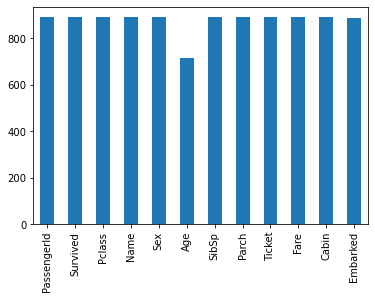

In [12]:
data.count().plot(kind='bar')

In [13]:
data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin            0
Embarked         2
dtype: int64

2) Colonnes Age et Embarked

-- 177 valeurs manquantes pour l'âge, ce serait dommage de supprimer autant de données, plutôt imputer les valeurs d'âge manquantes. Seules deux valeurs manquantes pour embarked, imputable aussi.

-- Plusieurs méthodes possibles : simple imputer, iterative imputer, kNN imputer

In [14]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2)

Difficilement transformer chaque nom en valeur numérique sans perdre l'information de l'écriture du nom et à priori le numéro de ticket ne code pas d'information particulière. Pour l'instant, je supprime ces colonnes.

In [15]:
data=data.drop(['Name', 'Ticket'], axis=1)

Transformation de toutes les valeurs en type numérique puis imputation à tout le dataframe
Deux colonnes à transformer : sexe et embarked. Fonction get_dumies

In [16]:
Colonnes = data[['Sex', 'Embarked']]
ColonnesConverties = pd.get_dummies(Colonnes, drop_first=True)

In [17]:
ColonnesConverties.head()

,Sex_male,Embarked_Q,Embarked_S
0,1,0,1
1,0,0,0
2,0,0,1
3,0,0,1
4,1,0,1


In [18]:
data = data.drop(['Sex', 'Embarked'], axis=1)
data = pd.concat([data, ColonnesConverties], axis=1)
data.head()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Cabin,Sex_male,Embarked_Q,Embarked_S
0,1,0,3,22.0,1,0,7.2500,0,1,0,1
1,2,1,1,38.0,1,0,71.2833,1,0,0,0
2,3,1,3,26.0,0,0,7.9250,0,0,0,1
3,4,1,1,35.0,1,0,53.1000,1,0,0,1
4,5,0,3,35.0,0,0,8.0500,0,1,0,1


In [19]:
data.tail()#id88 age=Nan

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Cabin,Sex_male,Embarked_Q,Embarked_S
886,887,0,2,27.0,0,0,13.00,0,1,0,1
887,888,1,1,19.0,0,0,30.00,1,0,0,1
888,889,0,3,NaN,1,2,23.45,0,0,0,1
889,890,1,1,26.0,0,0,30.00,1,1,0,0
890,891,0,3,32.0,0,0,7.75,0,1,1,0


In [20]:
data = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)

<AxesSubplot:>

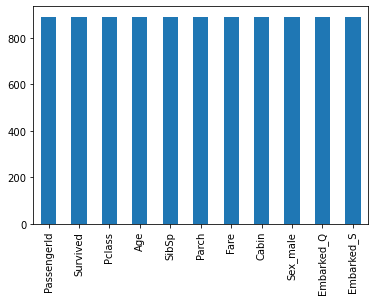

In [21]:
data.count().plot(kind='bar')

In [22]:
data.tail()#age de id 888 n'est plus un Nan

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Cabin,Sex_male,Embarked_Q,Embarked_S
886,887.0,0.0,2.0,27.0,0.0,0.0,13.00,0.0,1.0,0.0,1.0
887,888.0,1.0,1.0,19.0,0.0,0.0,30.00,1.0,0.0,0.0,1.0
888,889.0,0.0,3.0,29.0,1.0,2.0,23.45,0.0,0.0,0.0,1.0
889,890.0,1.0,1.0,26.0,0.0,0.0,30.00,1.0,1.0,0.0,0.0
890,891.0,0.0,3.0,32.0,0.0,0.0,7.75,0.0,1.0,1.0,0.0


In [23]:
data.isna().sum() #plus de nan !

PassengerId    0
Survived       0
Pclass         0
Age            0
SibSp          0
Parch          0
Fare           0
Cabin          0
Sex_male       0
Embarked_Q     0
Embarked_S     0
dtype: int64

aide : https://medium.com/@kyawsawhtoon/a-guide-to-knn-imputation-95e2dc496e

     -  Rechercher doublons

https://jasonicarter.github.io/survival-analysis-titanic-data/

In [24]:
data.duplicated().sum() #aucun doublons

0

    - Rechercher et traiter les outliers

https://medium.com/analytics-vidhya/identifying-cleaning-and-replacing-outliers-titanic-dataset-20182a062893

https://github.com/deepaligarg/Titanic-Outlier-Detection/blob/master/TitanicDS_OutlierDiscussion_StdDev_IQR.ipynb

In [25]:
print (data.columns)

Index(['PassengerId', 'Survived', 'Pclass', 'Age', 'SibSp', 'Parch', 'Fare',
       'Cabin', 'Sex_male', 'Embarked_Q', 'Embarked_S'],
      dtype='object')


Parmis ces colonnes, celles susceptibles de contenir des outliers sont Age, Fare, peut-être SibSp ( nombre de frères et soeurs à bord) et Parch (nombre d'enfants/parents à bord)

<AxesSubplot:>

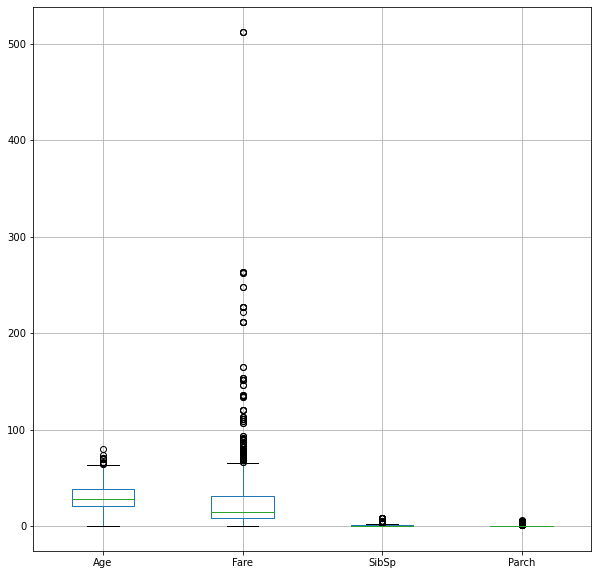

In [26]:
#visualisation
data.boxplot(column=['Age','Fare','SibSp','Parch'], figsize=(10,10))

<AxesSubplot:>

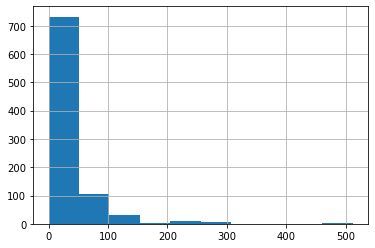

In [27]:
data['Fare'].hist()

<AxesSubplot:>

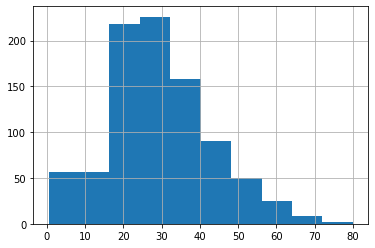

In [28]:
data['Age'].hist()

<AxesSubplot:>

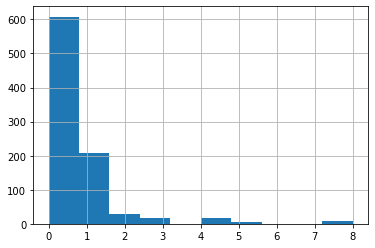

In [29]:
data['SibSp'].hist()

<AxesSubplot:>

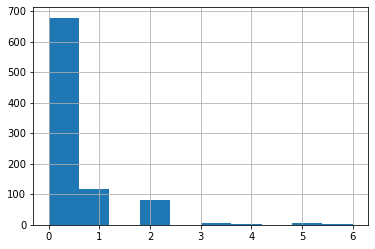

In [30]:
data['Parch'].hist()

Beaucoup de valeurs au dessus du critère de tukey pour colonnes Age et surtout Fare.
Soit supprimer et remplacer valeurs manquantes, soit on  garde car peuvent être finalement une source d'information et on utilise plutôt des méthodes robustes aux outliers (utilisation de régularisation) tel que regression ridge et lasso (cours Nicolas Rochet)

Visualisation

<AxesSubplot:xlabel='Survived', ylabel='count'>

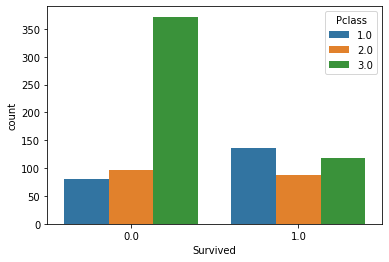

In [31]:
sns.countplot(x='Survived', hue='Pclass', data=data)

**Séparation dataset entrainement et dataset test**

In [32]:
X = data.drop('Survived', axis=1)
y= data['Survived']

In [33]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

**Test de modèles**

**Régression logistique**

In [34]:
from sklearn.linear_model import LogisticRegression

In [35]:
logistic_regression = LogisticRegression()

In [36]:
lr = logistic_regression.fit(X_train, y_train)

C:\Users\sophi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [37]:
y_pred = logistic_regression.predict(X_test)
y_pred

array([0., 0., 0., 1., 1., 1., 1., 0., 1., 1., 0., 0., 0., 0., 0., 1., 0.,
       1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 1.,
       0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1.,
       1., 0., 1., 0., 1., 0., 1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 0.,
       0., 1., 1., 1., 1., 1., 0., 0., 1., 1., 1., 1., 0., 1., 1., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       1., 0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 1.,
       1., 0., 1., 1., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 1., 0., 1.,
       1., 0., 0., 1., 0., 1., 0., 0., 1., 1., 0., 0., 1., 0., 0., 0., 0.,
       1., 0., 0., 0., 1., 1., 1., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0.,
       0., 1., 0., 1., 0., 0., 0., 1., 1.])

In [38]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [39]:
accuracy_score(y_test, y_pred)

0.7932960893854749

In [40]:
y_test.shape

(179,)

In [41]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.81      0.85      0.83       105
         1.0       0.77      0.72      0.74        74

    accuracy                           0.79       179
   macro avg       0.79      0.78      0.78       179
weighted avg       0.79      0.79      0.79       179



In [42]:
confusion_matrix(y_test, y_pred)

array([[89, 16],
       [21, 53]], dtype=int64)

Interprétation :

    Vrai positif 89
    Vrai négatif 53
    Faux positif 16
    Faux negatif 21

**Interprétabilité**

Les attributs du LogisticRegression sont les suivants :

- coef_ : renvoi le coefficient des caractéristiques de la fonction de décision.

- intercept_ : représente la constante ajoutée à la fonction de décision.

- n_iter_ : renvoi le nombre réel d’itérations pour chaque classe.

In [43]:
lr.coef_

array([[ 9.56447217e-04, -8.26276395e-02, -1.14119072e-02,
        -2.21461523e-01, -2.30524672e-01,  8.16389366e-03,
         1.07958502e+00, -2.66363484e+00,  1.11772890e-01,
        -4.96127458e-02]])

In [44]:
lr.intercept_

array([0.88976831])

In [45]:
lr.n_iter_

array([100])

**Arbre de décision**

In [46]:
from sklearn.tree import DecisionTreeClassifier

In [47]:
decision_tree = DecisionTreeClassifier(max_depth=2)

In [48]:
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=2)

In [49]:
tree_prediction = decision_tree.predict(X_test)

In [50]:
y_val = decision_tree.predict(X_train)
accuracy_score(y_train, y_val)

0.8033707865168539

In [51]:
decision_tree.score(X_test,y_test)

0.7653631284916201

In [52]:
accuracy_score(y_test, tree_prediction)

0.7653631284916201

In [53]:
confusion_matrix(y_test, tree_prediction)

array([[100,   5],
       [ 37,  37]], dtype=int64)

In [54]:
print(classification_report(y_test, tree_prediction))

              precision    recall  f1-score   support

         0.0       0.73      0.95      0.83       105
         1.0       0.88      0.50      0.64        74

    accuracy                           0.77       179
   macro avg       0.81      0.73      0.73       179
weighted avg       0.79      0.77      0.75       179



[Text(334.8, 543.6, 'X[7] <= 0.5\ngini = 0.469\nsamples = 712\nvalue = [444, 268]'),
 Text(167.4, 326.16, 'X[1] <= 2.5\ngini = 0.386\nsamples = 245\nvalue = [64, 181]'),
 Text(83.7, 108.72000000000003, 'gini = 0.074\nsamples = 130\nvalue = [5, 125]'),
 Text(251.10000000000002, 108.72000000000003, 'gini = 0.5\nsamples = 115\nvalue = [59, 56]'),
 Text(502.20000000000005, 326.16, 'X[2] <= 6.5\ngini = 0.303\nsamples = 467\nvalue = [380, 87]'),
 Text(418.5, 108.72000000000003, 'gini = 0.444\nsamples = 24\nvalue = [8, 16]'),
 Text(585.9, 108.72000000000003, 'gini = 0.269\nsamples = 443\nvalue = [372, 71]')]

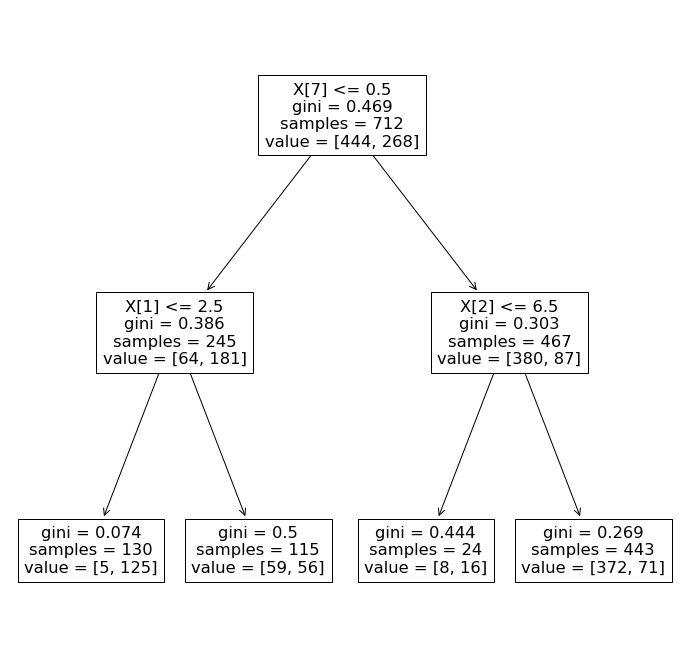

In [55]:
from sklearn import tree
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12, 12))
tree.plot_tree(decision_tree) 

**Random forest**

In [56]:
from sklearn.ensemble import RandomForestClassifier

In [57]:
RF = RandomForestClassifier(max_depth=10, n_estimators = 100)

In [58]:
RF.fit(X_train, y_train)

RandomForestClassifier(max_depth=10)

In [59]:
rf_prediction = RF.predict(X_test)

In [60]:
accuracy_score(y_test, rf_prediction)

0.8212290502793296

In [61]:
print(classification_report(y_test, prediction))

NameError: name 'prediction' is not defined

In [62]:
confusion_matrix(y_test, rf_prediction)

array([[93, 12],
       [20, 54]], dtype=int64)

**Réseau de neurones**

In [63]:
from sklearn.neural_network import MLPClassifier

In [64]:
MLPC = MLPClassifier(hidden_layer_sizes=(10,20))

In [65]:
MLPC.fit(X_train, y_train)

MLPClassifier(hidden_layer_sizes=(10, 20))

In [66]:
prediction = MLPC.predict(X_test)
accuracy_score(y_test, prediction)

0.7206703910614525

In [67]:
confusion_matrix(y_test, prediction)

array([[98,  7],
       [43, 31]], dtype=int64)

In [68]:
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

         0.0       0.70      0.93      0.80       105
         1.0       0.82      0.42      0.55        74

    accuracy                           0.72       179
   macro avg       0.76      0.68      0.68       179
weighted avg       0.74      0.72      0.70       179



**Cross validation**

In [69]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(logistic_regression, X, y, cv=5)
print ('Cross validation - Régression logistique :')
print('scores = ', scores)
print('score moyen =', np.mean(scores))

C:\Users\sophi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\sophi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

Cross validation - Régression logistique :
scores =  [0.79329609 0.80898876 0.7752809  0.76966292 0.79775281]
score moyen = 0.7889962965287804


C:\Users\sophi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\sophi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

In [70]:
scores = cross_val_score(decision_tree, X, y, cv=5)
print ('Cross validation - Arbre de décision :')
print('scores = ', scores)
print('score moyen =', np.mean(scores))

Cross validation - Arbre de décision :
scores =  [0.74860335 0.79213483 0.78651685 0.75280899 0.78651685]
score moyen = 0.773316176009039


In [71]:
scores = cross_val_score(RF, X, y, cv=5)
print ('Cross validation - Random forest :')
print('scores = ', scores)
print('score moyen =', np.mean(scores))

Cross validation - Random forest :
scores =  [0.77653631 0.80337079 0.85955056 0.8258427  0.85955056]
score moyen = 0.8249701839181469


In [72]:
scores = cross_val_score(MLPC, X, y, cv=5)
print ('Cross validation - Réseau de neurones :')
print('scores = ', scores)
print('score moyen =', np.mean(scores))

C:\Users\sophi\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Cross validation - Réseau de neurones :
scores =  [0.61452514 0.65168539 0.74157303 0.74157303 0.69662921]
score moyen = 0.6891971627644216


**Interprétabilité**

**Librairie Lime, interprétabilité random forest classifier**

site source : 
https://betterdatascience.com/lime/

In [73]:
pip install lime

Note: you may need to restart the kernel to use updated packages.


In [74]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=[0, 1],
    mode='classification'
)

In [75]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[1], 
    predict_fn=RF.predict_proba
)

exp.show_in_notebook(show_table=True)

In [76]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[4], 
    predict_fn=RF.predict_proba
)

exp.show_in_notebook(show_table=True)

In [77]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[6], 
    predict_fn=RF.predict_proba
)

exp.show_in_notebook(show_table=True)

In [78]:
#heuu colonne passenger Id à supprimer non?

**Librairie Lime, interprétabilité réseau de neurones**

In [79]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[1], 
    predict_fn=MLPC.predict_proba
)

exp.show_in_notebook(show_table=True)

In [80]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[4], 
    predict_fn=MLPC.predict_proba
)

exp.show_in_notebook(show_table=True)

In [81]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[6], 
    predict_fn=MLPC.predict_proba
)

exp.show_in_notebook(show_table=True)

**Librairie Shap**

In [82]:
pip install shap

In [83]:
import shap

explainer = shap.TreeExplainer(RF)
shap_values = explainer.shap_values(X)

In [84]:
shap.force_plot(explainer.expected_value[1], shap_values[1], X)

In [85]:
shap.force_plot(explainer.expected_value[0], shap_values[1], X)

Librairie ELI5

In [86]:
pip install eli5

  Using cached eli5-0.13.0-py2.py3-none-any.whl
  Using cached graphviz-0.20.1-py3-none-any.whl (47 kB)
  Using cached Jinja2-3.1.2-py3-none-any.whl (133 kB)
  Using cached tabulate-0.8.10-py3-none-any.whl (29 kB)
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
Note: you may need to restart the kernel to use updated packages.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
anaconda-project 0.10.1 requires ruamel-yaml, which is not installed.
cookiecutter 1.7.2 requires Jinja2<3.0.0, but you have jinja2 3.1.2 which is incompatible.
cookiecutter 1.7.2 requires MarkupSafe<2.0.0, but you have markupsafe 2.1.1 which is incompatible.


**Librairies de vigilance aux biais**

https://towardsdatascience.com/mitigating-bias-in-ai-with-aif360-b4305d1f88a9

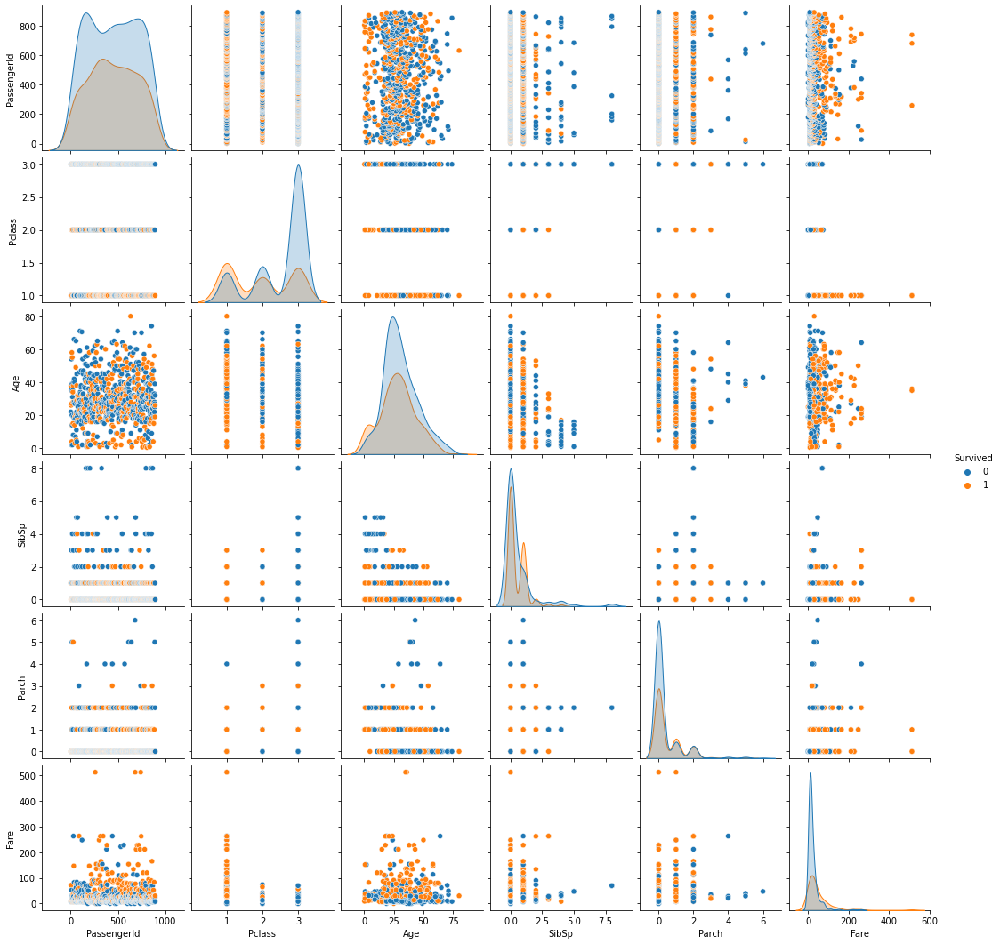

In [14]:
sns.pairplot(data, hue="Survived")

* Trier/nettoyer les données

In [15]:
data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [27]:
#Column Cabin avec 687 NaN sur 891 lignes soit 77% de la colonne : 
# si supression des lignes contenant des NaN = perte de données ++
# si estimation avec les 204 données = quelle pertinence?
del df['Cabin']

In [16]:
data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [17]:
# Dans un premier temps suppression des NaN pour les autres colonnes
data_clean = data.dropna()
data_clean.isnull().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
Embarked       0
dtype: int64

In [ ]:
# Plutôt essayer d'imputer les NaN dans la colonne âge ? SimpleImputer ou IterativeImputer ou kNNImputer dans sklearn
#Doublons?

In [18]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183 entries, 1 to 889
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  183 non-null    int64  
 1   Survived     183 non-null    int64  
 2   Pclass       183 non-null    int64  
 3   Name         183 non-null    object 
 4   Sex          183 non-null    object 
 5   Age          183 non-null    float64
 6   SibSp        183 non-null    int64  
 7   Parch        183 non-null    int64  
 8   Ticket       183 non-null    object 
 9   Fare         183 non-null    float64
 10  Cabin        183 non-null    object 
 11  Embarked     183 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 18.6+ KB


In [20]:
data_cleanName = data_clean['Name']
print("Duplicated values", data_cleanName)

Duplicated values 1      Cumings, Mrs. John Bradley (Florence Briggs Th...
3           Futrelle, Mrs. Jacques Heath (Lily May Peel)
6                                McCarthy, Mr. Timothy J
10                       Sandstrom, Miss. Marguerite Rut
11                              Bonnell, Miss. Elizabeth
                             ...                        
871     Beckwith, Mrs. Richard Leonard (Sallie Monypeny)
872                             Carlsson, Mr. Frans Olof
879        Potter, Mrs. Thomas Jr (Lily Alexenia Wilson)
887                         Graham, Miss. Margaret Edith
889                                Behr, Mr. Karl Howell
Name: Name, Length: 183, dtype: object


In [21]:
data_cleanPassengerId = data_clean['PassengerId']
print("Duplicated values", data_cleanPassengerId)

Duplicated values 1        2
3        4
6        7
10      11
11      12
      ... 
871    872
872    873
879    880
887    888
889    890
Name: PassengerId, Length: 183, dtype: int64


* visualiser les données : quel(s) grah(s)?

<AxesSubplot:>

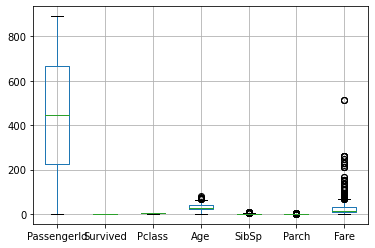